# Task 3 Augmentation
5390<br>
Elaina Rohlfing

## Load the data
* Upload & unzip the dataset
* Load training and validation images

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
! rm -rf morel-dataset
! unzip -qq "/content/drive/MyDrive/Colab Notebooks/morel-dataset.zip"
! mv morel-dataset* morel-dataset

In [4]:
! ls -l morel-dataset/validation

total 8
drwxr-xr-x 2 root root 4096 May  3 04:57 morel
drwxr-xr-x 2 root root 4096 May  3 04:58 none


## Prepare the images (training and validation)

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np

def get_images(image_size=(256, 256), size_of_batch=32):
    # Rescale all images
    img_generator = ImageDataGenerator(rescale=1./255)

    tr = img_generator.flow_from_directory( "./morel-dataset/train", target_size=image_size, shuffle=True, seed=999, class_mode='binary', classes=["none", "morel"], batch_size=size_of_batch)
    val = img_generator.flow_from_directory( "./morel-dataset/validation", target_size=image_size, shuffle=True, seed=999, class_mode='binary', classes=["none", "morel"], batch_size=size_of_batch)
    tst = img_generator.flow_from_directory( "./morel-dataset/test", target_size=image_size, shuffle=True, seed=999, class_mode='binary', classes=["none", "morel"], batch_size=size_of_batch)
    return tr, val, tst


# Review details of dataset
def print_data_characteristics(data):
    print(f'{data.class_indices=}')
    print(f'{data.num_classes=}')
    print(f'{data.batch_size=}')
    print(f'{data.samples=}')
    print(f'{data.image_shape=}')
    imgs, lbls = data[0]
    print(f'{lbls.shape=}')
    print(f'{lbls=}')

    # check baseline accurracy (for majority class in binary classification)
    num_class0 = data.classes[data.classes == 0].size
    num_class1 = data.classes[data.classes == 1].size
    class1_relative_size = (100 * (num_class1/(num_class0 + num_class1)))
    class0_relative_size = (100 - class1_relative_size)
    if class1_relative_size > class0_relative_size:
        print(f'\nMajority class is class[1]\nBaseline accuracy for this dataset is: {class1_relative_size:.2f}%')
    else:
        print(f'\nMajority class is class[0]\nBaseline accuracy for this dataset is: {class0_relative_size:.2f}%')


# Displays one image and its label
def display_image(dataset, img_index=0, batch_index=0):
    images, labels = dataset[batch_index]
    class_index = int(labels[img_index])
    classes = list(dataset.class_indices.keys())

    plt.imshow(images[img_index])
    plt.title(f"Ground truth: {str(labels[img_index])}\n{classes[class_index]}") # add name of label train_ds.class_indices
    plt.axis("off")

# Displays multiple random images in a grid
def review_generator_results(image_gen, batch_number=0, num_images=6, num_rows=2):
    indices = np.random.choice(image_gen.batch_size, size=num_images, replace=False)
    plt.figure(figsize=(12, 8))
    for i, img_idx in enumerate(indices):
        plt.subplot(num_rows, (len(indices) + 1) // num_rows, i + 1)
        display_image(image_gen, img_idx, batch_number)
    plt.tight_layout()
    plt.show()
    print_data_characteristics(image_gen)

In [6]:
train_set, val_set, test_set = get_images(size_of_batch=13)
train_set.batch_size

Found 552 images belonging to 2 classes.
Found 160 images belonging to 2 classes.
Found 80 images belonging to 2 classes.


13

Display one image and its label

In [ ]:
print('TRAINING SET')
review_generator_results(train_set, num_images=6, num_rows=2, batch_number=0)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print('VALIDATION SET')
review_generator_results(val_set, num_images=6, num_rows=2, batch_number=2)

Output hidden; open in https://colab.research.google.com to view.

# Functions

## Plot learning curves

In [7]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def plot_learning_curves(hist, title, validate=False):
    fig, axs = plt.subplots(2, 1, figsize=(6, 7))
    epochs = range(1, len(hist.history['loss']) + 1)

    if validate:
        axs[0].plot(epochs, hist.history['val_accuracy'], label='Validation Accuracy', color="forestgreen")
    axs[0].plot(epochs, hist.history['accuracy'], label='Training Accuracy', color="limegreen")
    axs[0].set_title("Accuracy for " + title)
    axs[0].set_ylabel("Accuracy")
    axs[0].set_xlabel("Epochs")
    axs[0].set_ylim([0, 1])
    axs[0].legend()

    if validate:
        axs[1].plot(epochs, hist.history['val_loss'], label='Validation Loss', color="forestgreen")
    axs[1].plot(epochs, hist.history['loss'], label='Training Loss', color="limegreen")
    axs[1].set_title("Loss for " + title)
    axs[1].set_xlabel("Epochs")
    axs[1].set_ylabel("Loss")
    axs[1].set_ylim([0, 1])
    axs[1].legend()

    plt.tight_layout()
    plt.show()


def plot_multiple_history(histories, history_labels, title):
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(7, 4))

    colors = list([color for color, rgb in mcolors.CSS4_COLORS.items() if mcolors.rgb_to_hsv(mcolors.to_rgba(rgb)[:3])[2] < 0.9])

    # Plot training and validation accuracy
    for i, h in enumerate(histories):
        axs[0].plot(h.history['accuracy'], label=f'Train Acc {history_labels[i]}', color=colors[i])
        axs[0].plot(h.history['val_accuracy'], label=f'Val Acc {history_labels[i]}', color=colors[i], marker='o', markersize=3, linestyle='')
    axs[0].set_title(f'Accuracy - Model {i+1}')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_ylim([0, 1])
    axs[0].legend()

    # Plot training and validation loss
    for i, h in enumerate(histories):
        axs[1].plot(h.history['loss'], label=f'Train Loss {history_labels[i]}', color=colors[i])
        axs[1].plot(h.history['val_loss'], label=f'Val Loss {history_labels[i]}', color=colors[i], marker='o', markersize=3, linestyle='')
    axs[1].set_title(f'Loss - Model {i+1}')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].set_ylim([0, 1])
    axs[1].legend()

    plt.tight_layout()
    plt.show()

## View Predictions

In [8]:
# modified code from chatgpt
def plot_misclassified_images(model, data_generator, num_images_per_class=4):
    images, true_labels = data_generator.next()
    predictions = model.predict(images)
    predicted_labels = np.round(predictions).flatten().astype(int)  # Round predictions for binary classification

    misclassified_indices = np.where(predicted_labels != true_labels)[0][:10]
    misclassified_morel = np.where((predicted_labels == 1) & (predicted_labels != true_labels))[0][:]
    misclassified_none = np.where((predicted_labels == 0) & (predicted_labels != true_labels))[0][:]

    plt.figure(figsize=(12, 8))
    for i, idx in enumerate(misclassified_none):
        image = images[idx]
        true_label = 'Morel' if true_labels[idx] == 1 else 'None'
        predicted_label = 'Morel' if predicted_labels[idx] == 1 else 'None'

        plt.subplot(1, num_images_per_class, i + 1)
        plt.imshow(image)
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}\nPredicted: {predictions[idx]}')
        plt.axis('off')
        if i == (num_images_per_class - 1): break
    plt.tight_layout()
    plt.show()


    plt.figure(figsize=(12, 8))
    for j, idx in enumerate(misclassified_morel):
        image = images[idx]
        true_label = 'Morel' if true_labels[idx] == 1 else 'None'
        predicted_label = 'Morel' if predicted_labels[idx] == 1 else 'None'

        plt.subplot(1, num_images_per_class, j + 1)
        plt.imshow(image)
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}\nPredicted: {predictions[idx]}')
        plt.axis('off')
        if j == (num_images_per_class - 1): break
    plt.tight_layout()
    plt.show()

In [9]:
# modified code from chatgpt
def plot_successful_predictions(model, data_generator, num_images_per_class=4):
    images, true_labels = data_generator.next()
    predictions = model.predict(images)
    predicted_labels = np.round(predictions).flatten().astype(int)  # Round predictions for binary classification

    classified_indices = np.where(predicted_labels == true_labels)[0][:]
    classified_morel = np.where((predicted_labels == 1) & (predicted_labels == true_labels))[0][:]
    classified_none = np.where((predicted_labels == 0) & (predicted_labels == true_labels))[0][:]

    plt.figure(figsize=(12, 8))
    for i, idx in enumerate(classified_none):
        image = images[idx]  # Get the image from the generator
        true_label = 'Morel' if true_labels[idx] == 1 else 'None'
        predicted_label = 'Morel' if predicted_labels[idx] == 1 else 'None'

        plt.subplot(1, num_images_per_class, i + 1)
        plt.imshow(image)
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}\nPredicted: {predictions[idx]}')
        plt.axis('off')
        if i == (num_images_per_class - 1): break
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 8))
    for j, idx in enumerate(classified_morel):
        image = images[idx]  # Get the image from the generator
        true_label = 'Morel' if true_labels[idx] == 1 else 'None'
        predicted_label = 'Morel' if predicted_labels[idx] == 1 else 'None'

        plt.subplot(1, num_images_per_class, j + 1)
        plt.imshow(image)
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}\nPredicted: {predictions[idx]}')
        plt.axis('off')
        if j == (num_images_per_class - 1): break
    plt.tight_layout()
    plt.show()

## Check activations

In [ ]:
import matplotlib.pyplot as plt
from tensorflow import keras
import numpy as np

def get_img_array(img_path, target_size):
    image = keras.utils.load_img(img_path, target_size=target_size)
    array = keras.utils.img_to_array(image)
    array = np.expand_dims(array, axis=0)
    return array

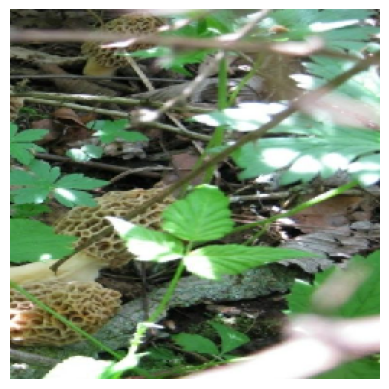

(1, 256, 256, 3)

In [ ]:
img_tensor = get_img_array("/content/0000000.jpg", target_size=(256, 256))

plt.imshow(img_tensor[0].astype('uint8'))
plt.axis('off')
plt.show()
img_tensor.shape

#model.predict(img_tensor)

In [ ]:
from tensorflow.keras import layers

layer_outputs = []
layer_names = []
for layer in model.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)
activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

In [ ]:
activations = activation_model.predict(img_tensor)

In [ ]:
import matplotlib.pyplot as plt

first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.matshow(first_layer_activation[0, :, :, 5], cmap="viridis")

In [ ]:
images_per_row = 2
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = max(1, n_features // images_per_row)
    print(f'{n_features=} {n_cols=} {size=}')
    display_grid = np.zeros(((size + 1) * n_cols - 1, images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype("uint8")
                display_grid[
                    col * (size + 1): (col + 1) * size + col,
                    row * (size + 1) : (row + 1) * size + row] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

## Visualizing convnet filters

### Instantiating my convolutional base

In [ ]:
# #model = keras.applications.xception.Xception(weights="imagenet",include_top=False)
# model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/tmp-models/best-for-8layer-256.hg5")
# model.summary()

**Printing the names of all convolutional layers in my model**

In [ ]:
for layer in model.layers:
    if isinstance(layer, (keras.layers.Conv2D, keras.layers.SeparableConv2D)):
        print(layer.name)

NameError: name 'model' is not defined

### Setup

**Creating a feature extractor model**

In [ ]:
layer_name = "conv2d_98"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)

**Using the feature extractor**

In [ ]:
activation = feature_extractor(keras.applications.xception.preprocess_input(img_tensor))

In [ ]:
import tensorflow as tf

def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

**Loss maximization via stochastic gradient ascent**

In [ ]:
@tf.function
def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image)
    grads = tf.math.l2_normalize(grads)
    image += learning_rate * grads
    return image

**Function to generate filter visualizations**

In [ ]:
img_width = 256
img_height = 256

def generate_filter_pattern(filter_index):
    iterations = 30
    learning_rate = 10.
    image = tf.random.uniform(
        minval=0.4,
        maxval=0.6,
        # generate a randomize image tensor
        shape=(1, img_width, img_height, 3))
    for i in range(iterations):
        # repeatedly update image values to generate an image that the selected channel responds to maximally
        image = gradient_ascent_step(image, filter_index, learning_rate)
    return image[0].numpy()

**Utility function to convert a tensor into a valid image**

In [ ]:
def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]
    return image

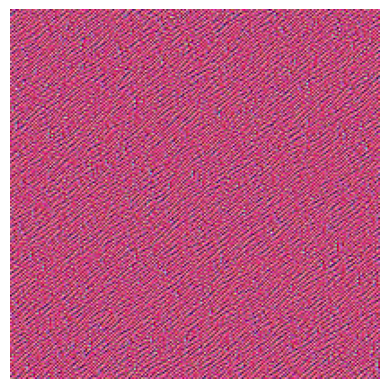

In [ ]:
plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=1)))

### Generating a grid of all filter response patterns in a layer

In [ ]:
all_images = []
for filter_index in range(activation.shape[-1]):
    print(f"Processing filter {filter_index}")
    image = deprocess_image(generate_filter_pattern(filter_index))
    all_images.append(image)

margin = 5
nrows = 3
ncols = (len(all_images)) // nrows
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = ncols * cropped_width + (ncols - 1) * margin
height = ncols * cropped_height + (ncols - 1) * margin
stitched_filters = np.zeros((width, height, 3))

for i in range(ncols):
    for j in range(ncols):
        image = all_images[i * ncols + j]
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :] = image
        if (i * ncols + j) == (len(all_images) - 1): break
    if (i * ncols + j) == (len(all_images) - 1): break

keras.utils.save_img(f"filters_for_layer_{layer_name}.png", stitched_filters)

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23


# Model build

In [10]:
from tensorflow.keras import callbacks
# general callback for all models
cb_stopping = callbacks.EarlyStopping(monitor="val_loss", patience=20)

# Creating Small Medium and Large Augmentation Sets

In [37]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

my_generator = ImageDataGenerator(rescale=1./255)
image_size = (256, 256)
batch = 32

# no augmentation is added to validation set
val_generator = ImageDataGenerator(rescale=1./255)

val_set = val_generator.flow_from_directory("/content/morel-dataset/validation", classes=["none", "morel"],
                                            target_size=image_size, batch_size=batch, class_mode='binary',
                                            seed=999, shuffle=True)

#######################
# training set with no augmentation
# train_generator = ImageDataGenerator(rescale=1./255)
#  train_set = train_generator.flow_from_directory("/content/morel-dataset/train", classes=["none", "morel"],
#                                                  target_size=image_size, batch_size=batch, class_mode='binary',
#                                                  seed=999, shuffle=True)

#######################
# training set with least augmentation
small_aug_train_generator = ImageDataGenerator(
    rescale=1./255,         # Normalize pixel values to [0,1]
    rotation_range=5,       # Randomly rotate images in the range (degrees, 0 to 180)
    width_shift_range=0.05,  # Randomly horizontal shift images
    height_shift_range=0.05, # Randomly vertical shift images
    zoom_range=0.05,         # Randomly zoom image
    vertical_flip=True,   # Randomly flip images horizontally
    fill_mode='nearest'     # Strategy used for filling in newly created pixels
)

train_set_small_aug = small_aug_train_generator.flow_from_directory("/content/morel-dataset/train", classes=["none", "morel"],
                                                                    target_size=image_size, batch_size=batch, class_mode='binary',
                                                                    seed=999, shuffle=True)

#######################
# training set with medium augmentation
medium_aug_train_generator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,       # Randomly rotate images in the range (degrees, 0 to 180)
    width_shift_range=0.15,  # Randomly horizontal shift images
    height_shift_range=0.15, # Randomly vertical shift images
    zoom_range=0.15,         # Randomly zoom image
    horizontal_flip=True,   # Randomly flip images horizontally
    fill_mode='nearest'     # Strategy used for filling in newly created pixels
)

train_set_medium_aug = medium_aug_train_generator.flow_from_directory("/content/morel-dataset/train", classes=["none", "morel"],
                                                                    target_size=image_size, batch_size=batch, class_mode='binary',
                                                                    seed=999, shuffle=True)

#######################
# training set with heavy augmentation
high_aug_train_generator = ImageDataGenerator(
    rescale=1./255,         # Normalize pixel values to [0,1]
    rotation_range=15,       # Randomly rotate images in the range (degrees, 0 to 180)
    width_shift_range=0.15,  # Randomly horizontal shift images
    height_shift_range=0.15, # Randomly vertical shift images
    zoom_range=0.15,         # Randomly zoom image
    horizontal_flip=True,   # Randomly flip images horizontally
    brightness_range=(0.8, 1.2),
    channel_shift_range=125,
    fill_mode='wrap'    # Strategy used for filling in newly created pixels
)

train_set_high_aug = high_aug_train_generator.flow_from_directory("/content/morel-dataset/train", classes=["none", "morel"],
                                                                    target_size=image_size, batch_size=batch, class_mode='binary',
                                                                    seed=999, shuffle=True)

#######################
# training set with ideal augmentation
ideal_aug_train_generator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=70,       # Randomly rotate images
    width_shift_range=0.15,  # Randomly horizontal shift images
    height_shift_range=0.15, # Randomly vertical shift images
    zoom_range=0.1,         # Randomly zoom image
    horizontal_flip=True,   # Randomly flip images horizontally
    brightness_range=(0.85, 1.2), # Randomly adjust brightness above or below 1
    channel_shift_range=90, # Randomly adjust
    fill_mode='reflect'    # preserve and smoothly extend the background so either more morels appear or more forest appears
)

train_set_ideal_aug = ideal_aug_train_generator.flow_from_directory("/content/morel-dataset/train", classes=["none", "morel"],
                                                                    target_size=image_size, batch_size=batch, class_mode='binary',
                                                                    seed=999, shuffle=True)

Found 160 images belonging to 2 classes.
Found 552 images belonging to 2 classes.
Found 552 images belonging to 2 classes.
Found 552 images belonging to 2 classes.
Found 552 images belonging to 2 classes.


# Training with minimal augmentation [loss: 0.4328 - accuracy: 0.7750]
* RESULT: Epoch 100/100 loss: 0.3738 - accuracy: 0.8370 - val_loss: 0.5438 - val_accuracy: 0.7563



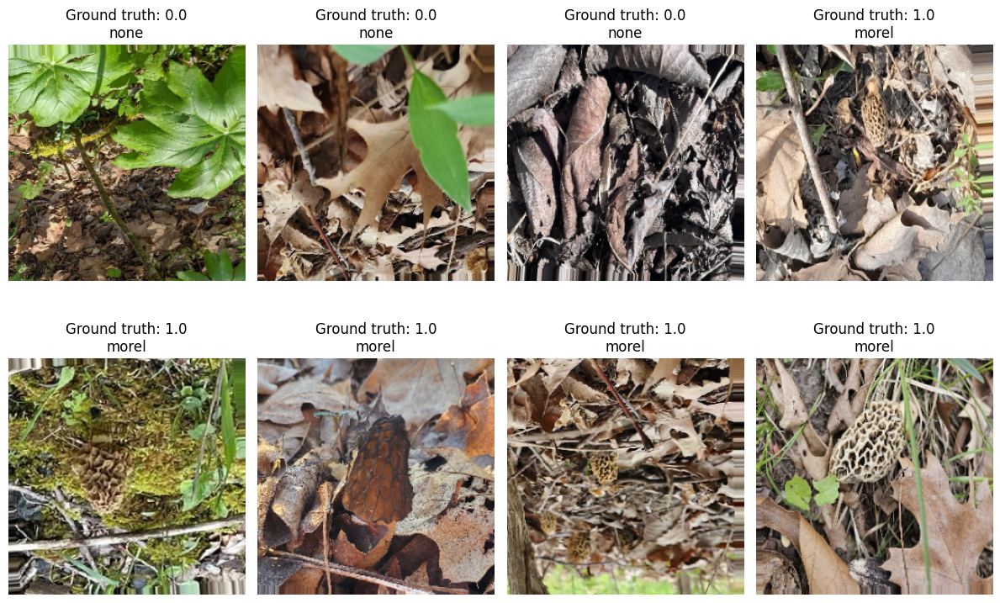

data.class_indices={'none': 0, 'morel': 1}
data.num_classes=2
data.batch_size=32
data.samples=552
data.image_shape=(256, 256, 3)
lbls.shape=(32,)
lbls=array([1., 0., 0., 1., 1., 0., 1., 0., 1., 1., 0., 0., 1., 0., 0., 0., 1.,
       1., 0., 1., 1., 0., 1., 1., 1., 1., 1., 0., 1., 0., 1., 1.],
      dtype=float32)

Majority class is class[0]
Baseline accuracy for this dataset is: 50.00%


In [ ]:
review_generator_results(train_set_small_aug, batch_number=0, num_images=8, num_rows=2)

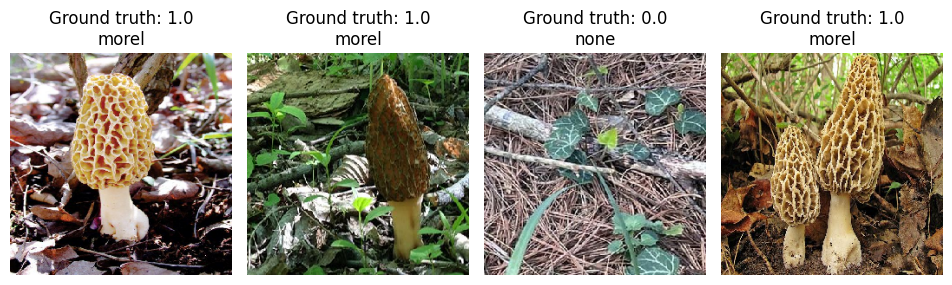

data.class_indices={'none': 0, 'morel': 1}
data.num_classes=2
data.batch_size=32
data.samples=160
data.image_shape=(256, 256, 3)
lbls.shape=(32,)
lbls=array([0., 1., 0., 1., 0., 0., 0., 1., 0., 0., 0., 1., 1., 0., 1., 0., 0.,
       0., 0., 1., 0., 0., 1., 0., 1., 0., 1., 1., 1., 1., 0., 1.],
      dtype=float32)

Majority class is class[0]
Baseline accuracy for this dataset is: 50.00%


In [ ]:
review_generator_results(val_set, batch_number=0, num_images=4, num_rows=1)

**Training with best model build from scratch**

In [42]:
import tensorflow as tf
from tensorflow.keras import layers, models
def model_best_fit(input):
    model_name="model_fresh_best_fit"
    num_filters = [6, 8, 12]
    filter_shape = (3, 3)
    inputshape = input.image_shape
    pad = 'same'
    pool = (8, 8)
    model = models.Sequential(name=model_name)
    model.add(layers.Conv2D(num_filters[0], kernel_size=filter_shape, activation='relu', padding=pad, input_shape=inputshape))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad, name="first_layer_pool"))
    model.add(layers.Conv2D(num_filters[1], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.MaxPooling2D(pool_size=pool, padding=pad))
    model.add(layers.Conv2D(num_filters[2], kernel_size=filter_shape, activation='relu', padding=pad))
    model.add(layers.Flatten())
    model.add(layers.Dense(4, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

In [21]:
train_set = train_set_small_aug
#val_set = val_set
num_epochs = 100
batch=64
amount = "small"
model = model_best_fit(train_set)
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-after_{model.name}_augmenting-{amount}.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} with minimal augmentation')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_fresh_best_fit"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 8)         440       
                                                                 
 max_pooling2d (MaxPooling2  (None, 4, 4, 8)           0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 12)          876       
                                                                 
 flatten (Flatten)           (None, 192)      

5/5 [==============================] - 1s 180ms/step - loss: 0.4328 - accuracy: 0.7750


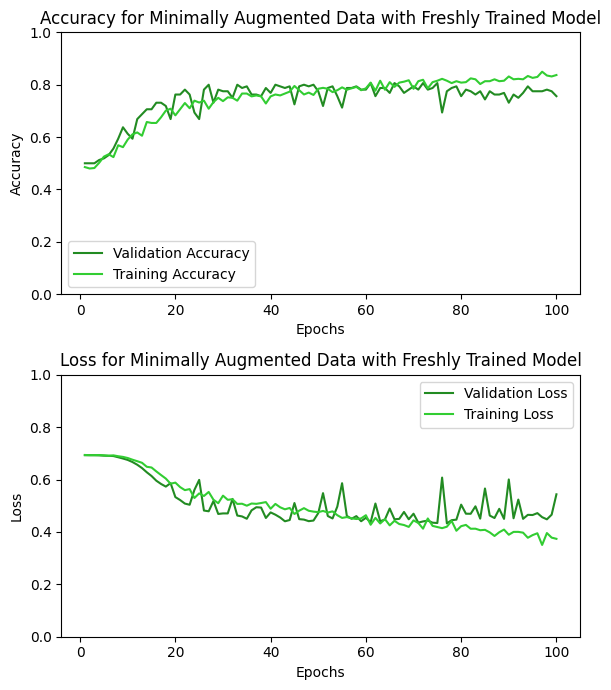

In [30]:
min_aug_model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-after_model_fresh_best_fit_augmenting-small.hg5")
min_aug_model.evaluate(val_set)
plot_learning_curves(history, title="Minimally Augmented Data with Freshly Trained Model", validate=True)

1/1 [==============================] - 0s 120ms/step


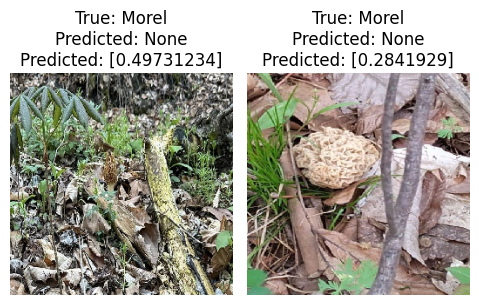

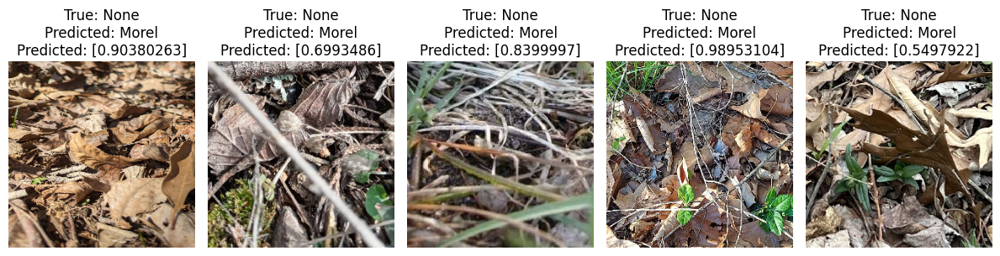

In [23]:
plot_misclassified_images(model, data_generator=val_set, num_images_per_class=5)

1/1 [==============================] - 0s 45ms/step


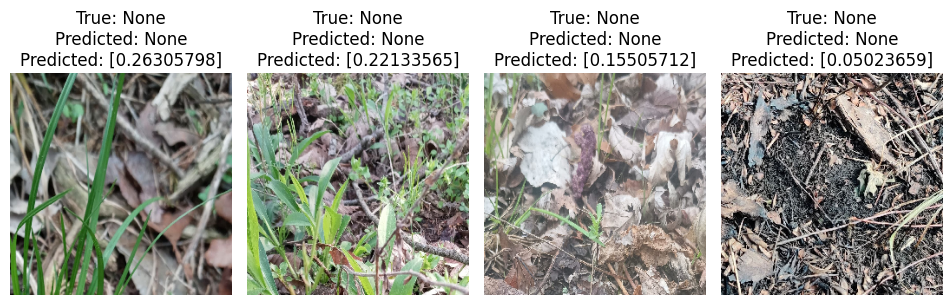

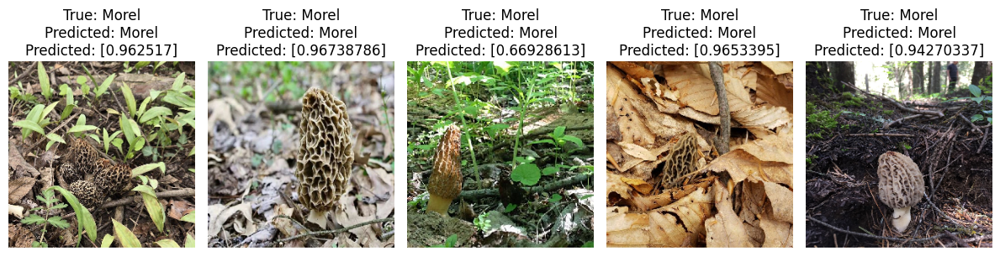

In [24]:
plot_successful_predictions(model, data_generator=val_set, num_images_per_class=5)

# Training with medium augmentation [loss: 0.3773 - accuracy: 0.8438]
*

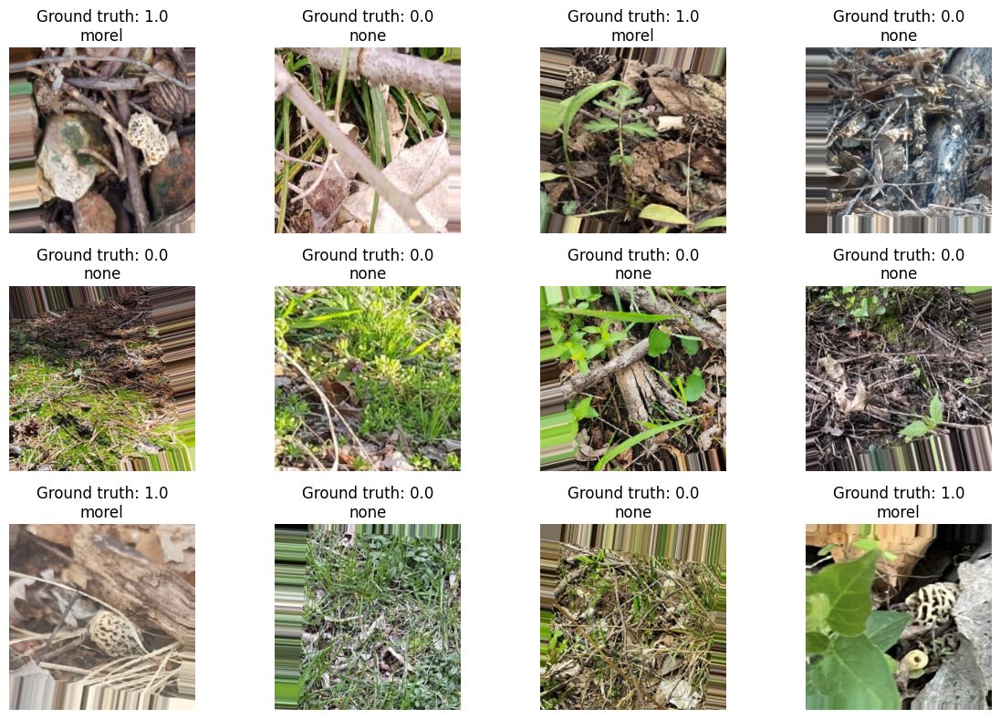

data.class_indices={'none': 0, 'morel': 1}
data.num_classes=2
data.batch_size=32
data.samples=400
data.image_shape=(256, 256, 3)
lbls.shape=(32,)
lbls=array([0., 0., 1., 0., 0., 1., 0., 0., 1., 1., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 1., 1., 1., 0., 0., 0., 0., 0., 1., 1.],
      dtype=float32)

Majority class is class[0]
Baseline accuracy for this dataset is: 62.50%


In [ ]:
review_generator_results(train_set_medium_aug, batch_number=0, num_images=12, num_rows=3)

In [34]:
train_set = train_set_medium_aug
#val_set = val_set
num_epochs = 100
batch=100
amount = "med"
model = model_best_fit(train_set)
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-after_{model.name}_augmenting-{amount}.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} with minimal augmentation')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_fresh_best_fit"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_13 (Conv2D)          (None, 32, 32, 8)         440       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 4, 4, 8)           0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 4, 4, 12)          876       
                                                                 
 flatten_4 (Flatten)         (None, 192)      

In [38]:
model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-after_model_fresh_best_fit_augmenting-med.hg5")
model.evaluate(val_set)

5/5 [==============================] - 1s 186ms/step - loss: 0.4409 - accuracy: 0.8375


[0.440889447927475, 0.8374999761581421]

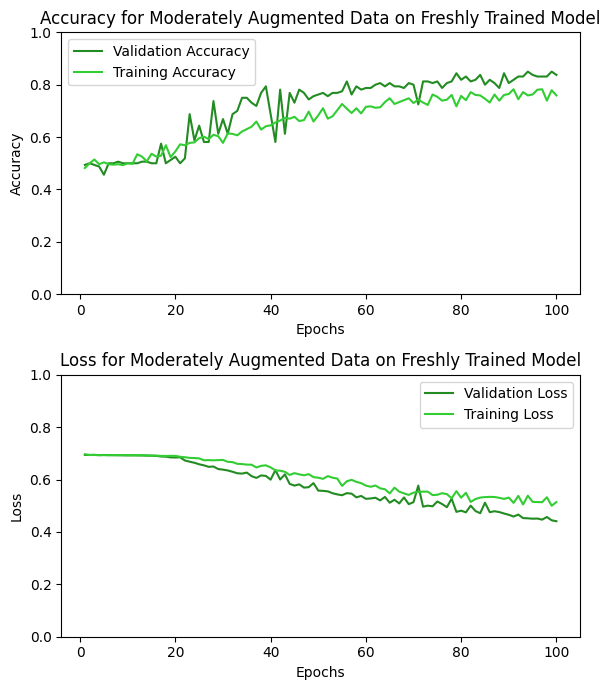

In [35]:
plot_learning_curves(history, title="Moderately Augmented Data on Freshly Trained Model", validate=True )

1/1 [==============================] - 0s 100ms/step


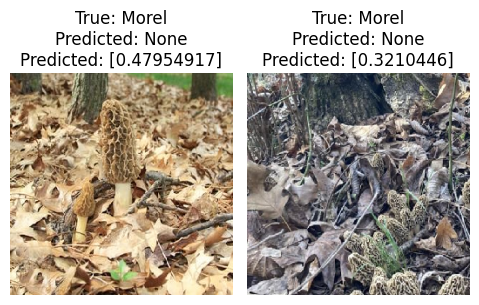

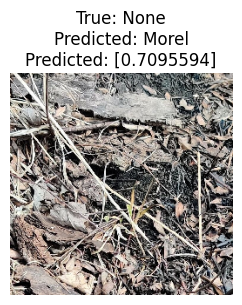

In [36]:
plot_misclassified_images(model, data_generator=val_set, num_images_per_class=5)

1/1 [==============================] - 0s 34ms/step


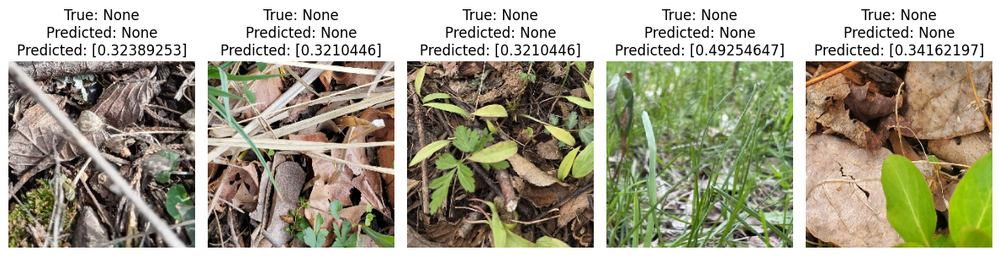

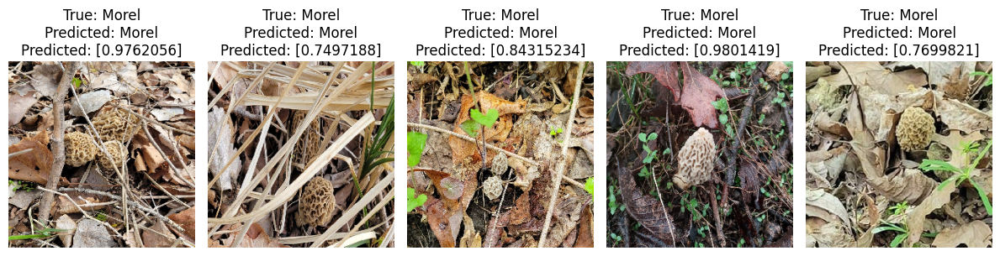

In [37]:
plot_successful_predictions(model, data_generator=val_set, num_images_per_class=5)

**Train for 150 more epochs**

In [14]:
from tensorflow import keras
from tensorflow.keras.models import load_model
train_set = train_set_medium_aug
#val_set = val_set
num_epochs = 150
batch=100
amount = "med-again"
model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-after_model_fresh_best_fit_augmenting-med.hg5")
model.evaluate(val_set)
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-after_{model.name}_augmenting-{amount}.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# fit
print(f'Additional training for {model.name} with medium augmentation')
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

5/5 [==============================] - 3s 96ms/step - loss: 0.4409 - accuracy: 0.8375
Model: "model_fresh_best_fit"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_13 (Conv2D)          (None, 32, 32, 8)         440       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 4, 4, 8)           0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 4, 4, 12)          876       
                          

5/5 [==============================] - 1s 164ms/step - loss: 0.3773 - accuracy: 0.8438


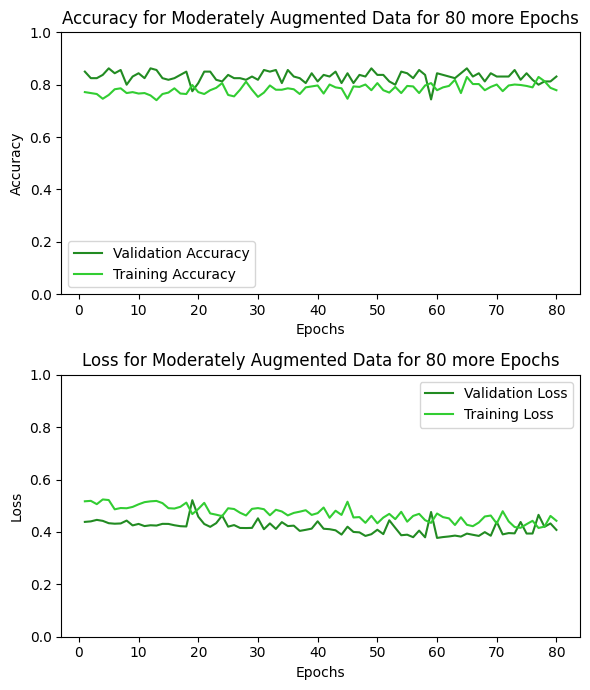

In [16]:
more_moderate_model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-after_model_fresh_best_fit_augmenting-med-again.hg5")
more_moderate_model.evaluate(val_set)
plot_learning_curves(history, title="Moderately Augmented Data for 80 more Epochs", validate=True)

# Training with heavy augmentation [loss: 0.3955 - accuracy: 0.8125]
* Epoch 100/100 loss: 0.5020 - accuracy: 0.7663 - val_loss: 0.4243 - val_accuracy: 0.8000
* Epoch 89/100 loss: 0.4327 - accuracy: 0.8134 - val_loss: 0.4367 - val_accuracy: 0.8313
 * "/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-after_model_fresh_best_fit_augmenting-heavy-again.hg5"

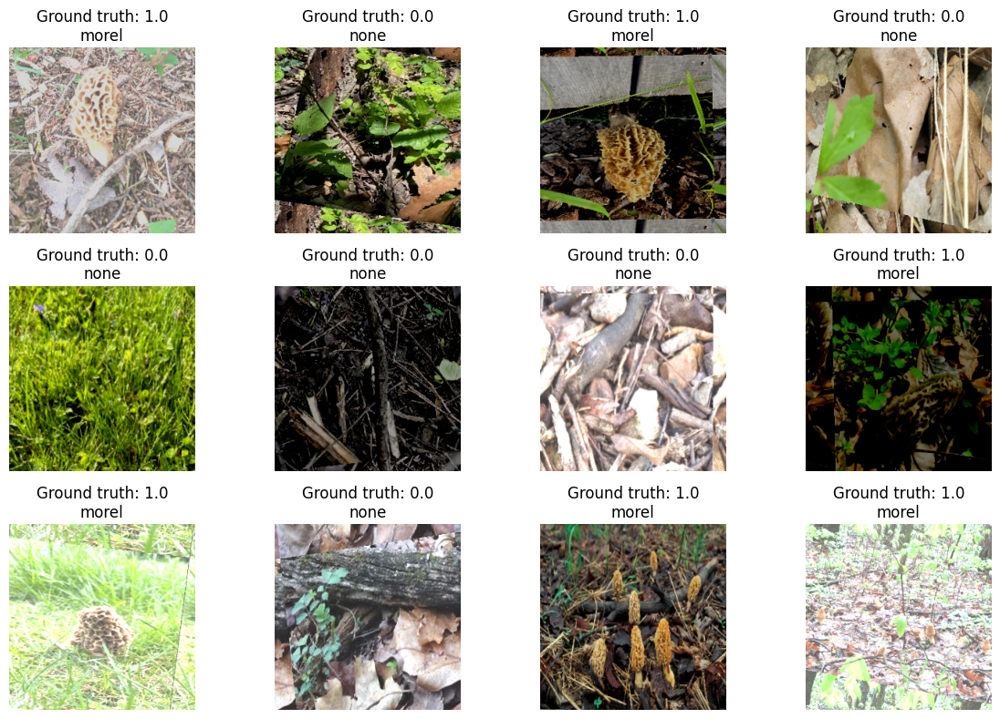

data.class_indices={'none': 0, 'morel': 1}
data.num_classes=2
data.batch_size=32
data.samples=552
data.image_shape=(256, 256, 3)
lbls.shape=(32,)
lbls=array([1., 0., 0., 1., 1., 0., 1., 0., 1., 1., 0., 0., 1., 0., 0., 0., 1.,
       1., 0., 1., 1., 0., 1., 1., 1., 1., 1., 0., 1., 0., 1., 1.],
      dtype=float32)

Majority class is class[0]
Baseline accuracy for this dataset is: 50.00%


In [112]:
review_generator_results(train_set_high_aug, batch_number=3, num_images=12, num_rows=3)

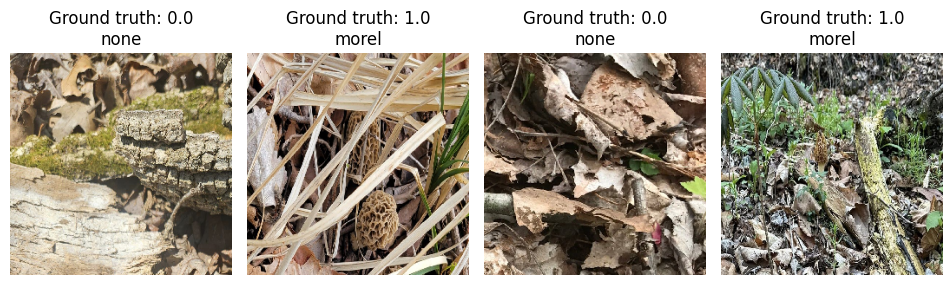

data.class_indices={'none': 0, 'morel': 1}
data.num_classes=2
data.batch_size=32
data.samples=160
data.image_shape=(256, 256, 3)
lbls.shape=(32,)
lbls=array([1., 1., 1., 0., 0., 0., 1., 1., 0., 1., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 1., 1., 0., 0., 1., 0., 1., 1., 1., 1., 1., 1., 1.],
      dtype=float32)

Majority class is class[0]
Baseline accuracy for this dataset is: 50.00%


In [113]:
review_generator_results(val_set, batch_number=0, num_images=4, num_rows=1)

In [114]:
train_set = train_set_high_aug
#val_set = val_set
num_epochs = 100
batch=100
amount = "heavy"
model = model_best_fit(train_set)
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-after_{model.name}_augmenting-{amount}.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} with heavy augmentation')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_fresh_best_fit"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_19 (Conv2D)          (None, 32, 32, 8)         440       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 4, 4, 8)           0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 4, 4, 12)          876       
                                                                 
 flatten_6 (Flatten)         (None, 192)      

5/5 [==============================] - 1s 183ms/step - loss: 0.4243 - accuracy: 0.8000


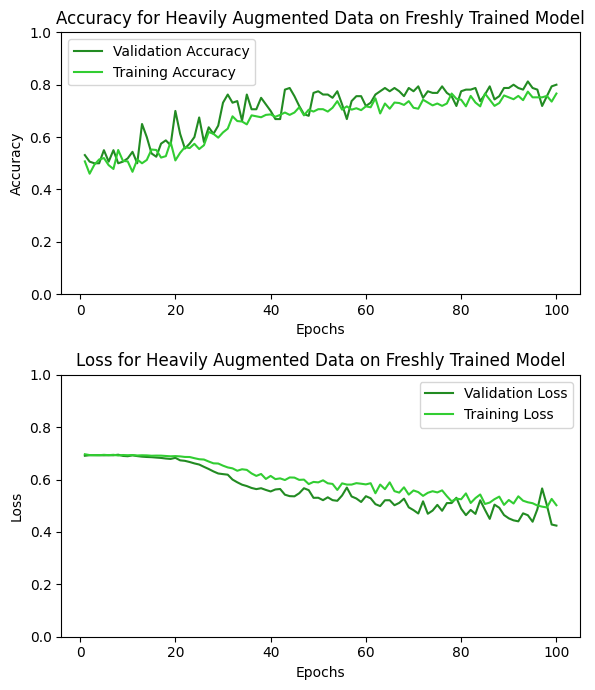

In [115]:
 model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-after_model_fresh_best_fit_augmenting-heavy.hg5")
 model.evaluate(val_set)
 plot_learning_curves(history, title="Heavily Augmented Data on Freshly Trained Model", validate=True)

1/1 [==============================] - 0s 99ms/step


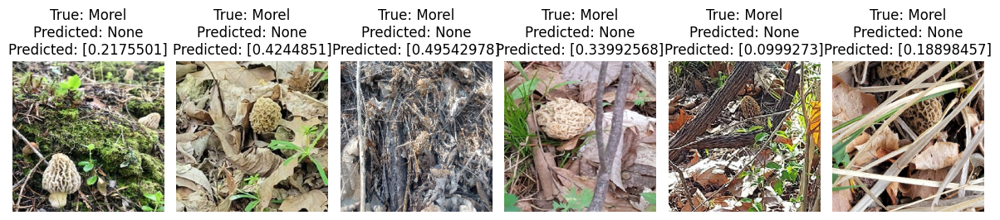

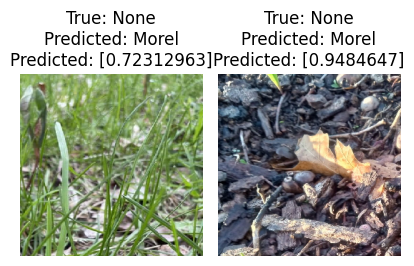

In [116]:
plot_misclassified_images(model, data_generator=val_set, num_images_per_class=6)

1/1 [==============================] - 0s 31ms/step


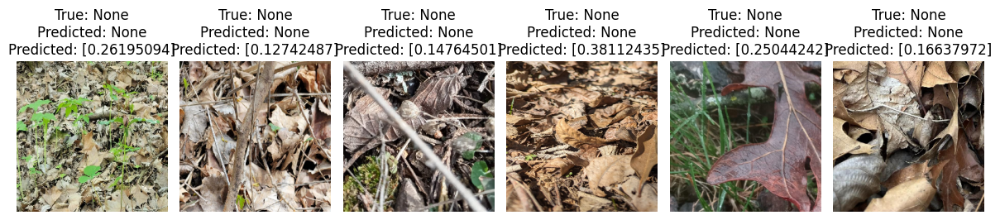

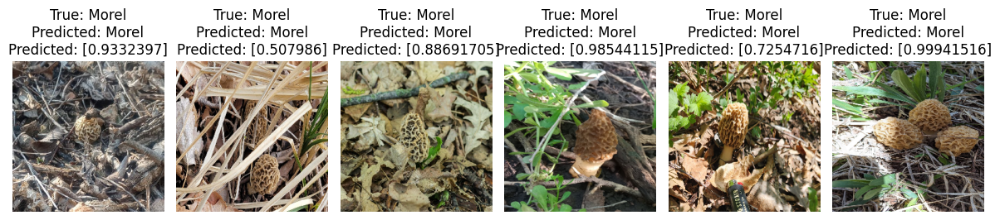

In [117]:
plot_successful_predictions(model, data_generator=val_set, num_images_per_class=6)

**train for 150 more epochs** [loss: 0.3955 - accuracy: 0.8125]
* 89 Epochs

In [119]:
#train for a few more epochs, include variables just to be sure.
train_set = train_set_high_aug
#val_set = val_set
num_epochs = 150
batch=100
amount = "heavy-again"
model = model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-after_model_fresh_best_fit_augmenting-heavy.hg5")
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-after_{model.name}_augmenting-{amount}.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# train
print(f'Training model {model.name} with heavy augmentation')
history1 = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_fresh_best_fit"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_19 (Conv2D)          (None, 32, 32, 8)         440       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 4, 4, 8)           0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 4, 4, 12)          876       
                                                                 
 flatten_6 (Flatten)         (None, 192)      

5/5 [==============================] - 1s 182ms/step - loss: 0.3955 - accuracy: 0.8125


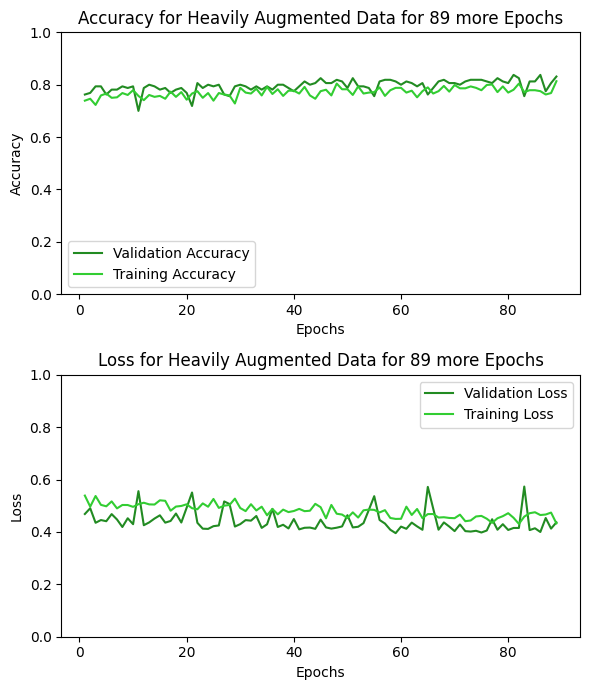

In [120]:
heavy_aug_model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-after_model_fresh_best_fit_augmenting-heavy-again.hg5")
heavy_aug_model.evaluate(val_set)
plot_learning_curves(history1, title="Heavily Augmented Data for 89 more Epochs", validate=True)

1/1 [==============================] - 0s 95ms/step


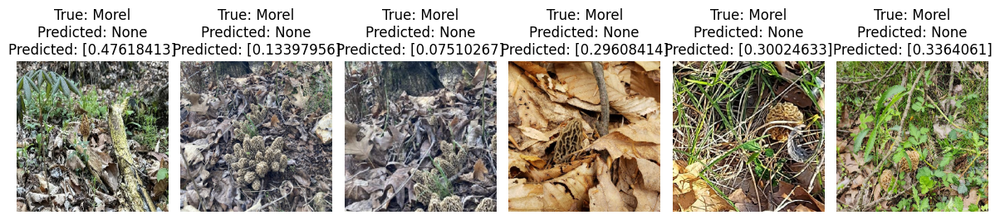

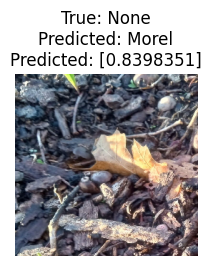

In [122]:
plot_misclassified_images(heavy_aug_model, data_generator=val_set, num_images_per_class=6)

1/1 [==============================] - 0s 33ms/step


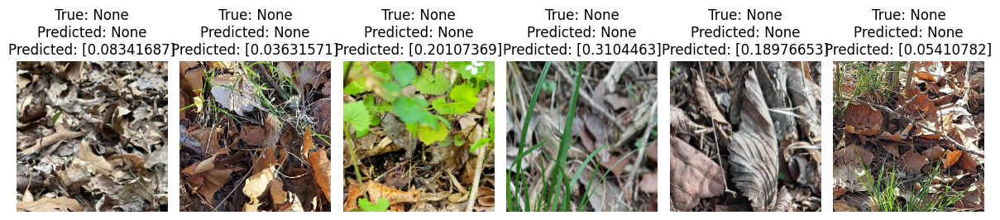

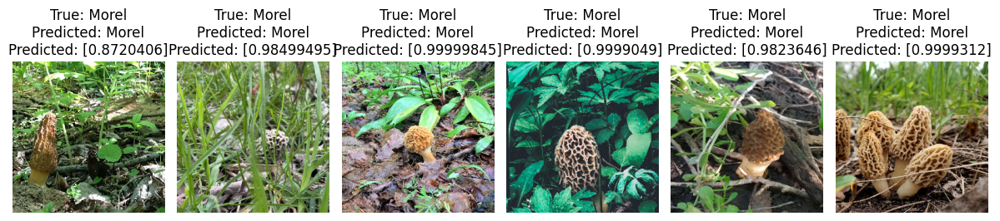

In [123]:
plot_successful_predictions(heavy_aug_model, data_generator=val_set, num_images_per_class=6)

# Training with best augmentation

In [28]:
from tensorflow.keras import callbacks
# tighter callback for this models
cb_stopping = callbacks.EarlyStopping(monitor="val_loss", patience=15)

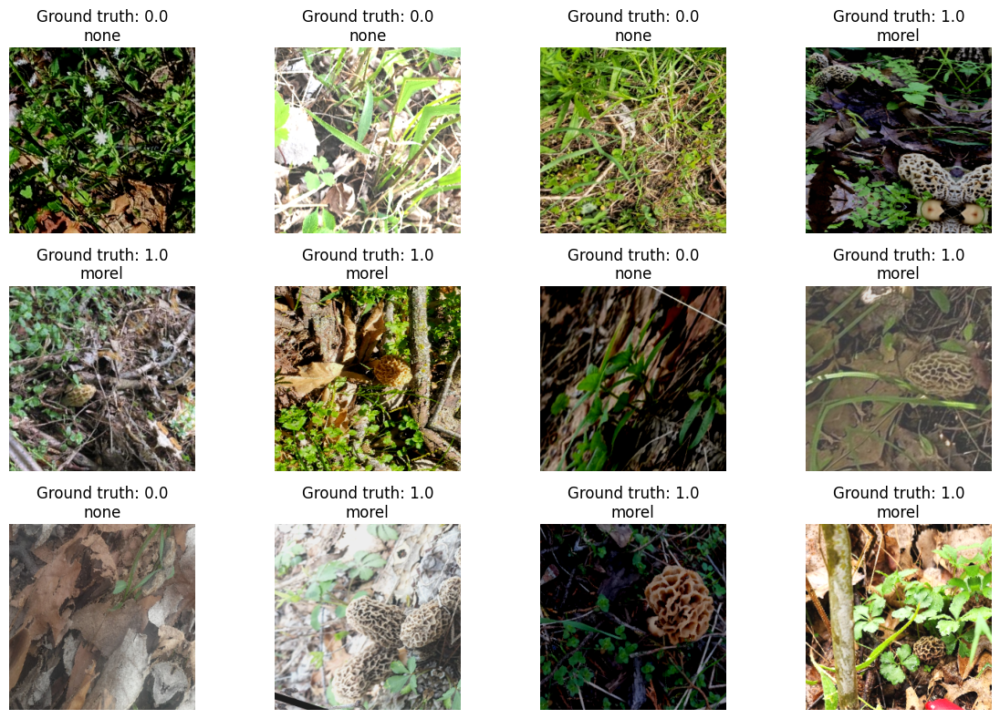

data.class_indices={'none': 0, 'morel': 1}
data.num_classes=2
data.batch_size=32
data.samples=552
data.image_shape=(256, 256, 3)
lbls.shape=(32,)
lbls=array([1., 0., 0., 1., 1., 0., 1., 0., 1., 1., 0., 0., 1., 0., 0., 0., 1.,
       1., 0., 1., 1., 0., 1., 1., 1., 1., 1., 0., 1., 0., 1., 1.],
      dtype=float32)

Majority class is class[0]
Baseline accuracy for this dataset is: 50.00%


In [39]:
review_generator_results(train_set_ideal_aug, batch_number=2, num_images=12, num_rows=3)

In [44]:
from tensorflow import keras
from tensorflow.keras.models import load_model
train_set = train_set_ideal_aug
#val_set = val_set
num_epochs = 100
batch=100
amount = "ideal"
model = model_best_fit(train_set)
model.summary()

# image callbacks
# set filepath for checkpointing
model_filename = f"best-after_{model.name}_augmenting-{amount}.hg5"
cb_checkpoint = callbacks.ModelCheckpoint(filepath=model_filename, save_best_only=True, monitor="val_loss")

# compile and fit
print(f'Training model {model.name} with augmentation')
model.compile(optimizer='rmsprop', loss = 'binary_crossentropy', metrics=['accuracy'])
history = model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Model: "model_fresh_best_fit"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 256, 256, 6)       168       
                                                                 
 first_layer_pool (MaxPooli  (None, 32, 32, 6)         0         
 ng2D)                                                           
                                                                 
 conv2d_4 (Conv2D)           (None, 32, 32, 8)         440       
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 4, 4, 8)           0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 4, 4, 12)          876       
                                                                 
 flatten_1 (Flatten)         (None, 192)      

5/5 [==============================] - 1s 183ms/step - loss: 0.4620 - accuracy: 0.8062


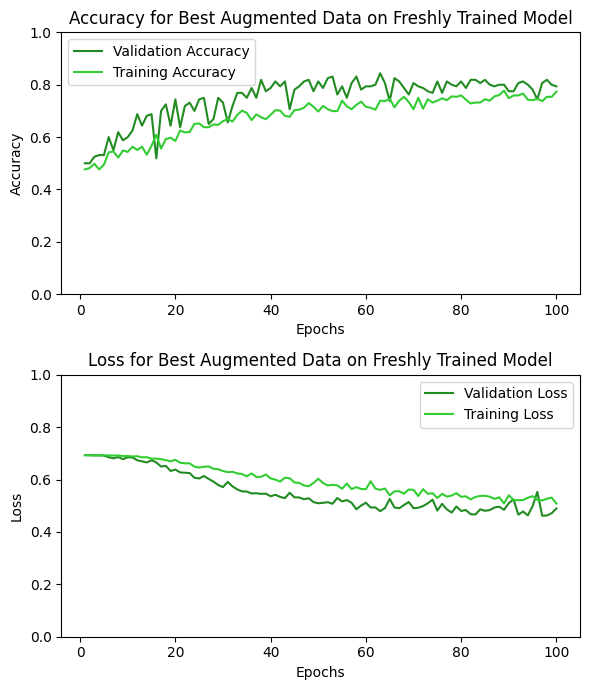

In [47]:
now_augmented_model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/bestmodels-newdata-0503/best-after_model_fresh_best_fit_augmenting-ideal.hg5")
now_augmented_model.evaluate(val_set)
plot_learning_curves(history, title="Best Augmented Data on Freshly Trained Model", validate=True)

In [48]:
num_epochs = 60
history = now_augmented_model.fit(train_set, validation_data=val_set, epochs=num_epochs, batch_size=batch, callbacks=[cb_checkpoint, cb_stopping])

Epoch 1/60
18/18 [==============================] - 13s 648ms/step - loss: 0.5171 - accuracy: 0.7446 - val_loss: 0.4686 - val_accuracy: 0.8062
Epoch 2/60
18/18 [==============================] - 12s 662ms/step - loss: 0.5356 - accuracy: 0.7355 - val_loss: 0.5340 - val_accuracy: 0.7500
Epoch 3/60
18/18 [==============================] - 12s 671ms/step - loss: 0.5210 - accuracy: 0.7627 - val_loss: 0.5125 - val_accuracy: 0.7937
Epoch 4/60
18/18 [==============================] - 12s 662ms/step - loss: 0.5173 - accuracy: 0.7681 - val_loss: 0.4636 - val_accuracy: 0.7937
Epoch 5/60
18/18 [==============================] - 12s 662ms/step - loss: 0.5304 - accuracy: 0.7428 - val_loss: 0.5124 - val_accuracy: 0.7563
Epoch 6/60
18/18 [==============================] - 12s 656ms/step - loss: 0.4940 - accuracy: 0.7645 - val_loss: 0.4984 - val_accuracy: 0.7812
Epoch 7/60
18/18 [==============================] - 12s 650ms/step - loss: 0.4995 - accuracy: 0.7754 - val_loss: 0.4922 - val_accuracy: 0.8000

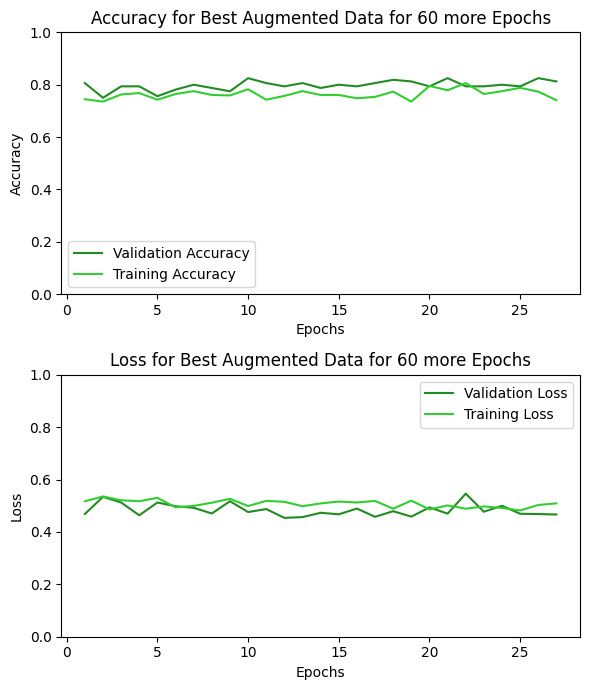

In [49]:
plot_learning_curves(history, title="Best Augmented Data for 60 more Epochs", validate=True)